# HR Analytics

### Problem Statement

Your client is a large MNC and they have 9 broad verticals across the organisation. One of the problem your client is facing is around identifying the right people for promotion (only for manager position and below) and prepare them in time. Currently the process, they are following is:

They first identify a set of employees based on recommendations/ past performance
Selected employees go through the separate training and evaluation program for each vertical. These programs are based on the required skill of each vertical
At the end of the program, based on various factors such as training performance, KPI completion (only employees with KPIs completed greater than 60% are considered) etc., employee gets promotion
For above mentioned process, the final promotions are only announced after the evaluation and this leads to delay in transition to their new roles. Hence, company needs your help in identifying the eligible candidates at a particular checkpoint so that they can expedite the entire promotion cycle. 

They have provided multiple attributes around Employee's past and current performance along with demographics. Now, The task is to predict whether a potential promotee at checkpoint in the test set will be promoted or not after the evaluation process.

### Importing libraries and changing display settings

In [1]:
#Importing the necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import random
import re
import os
import beepy
import pathlib
import seaborn as sn
import plotly.express as pe
import plotly.graph_objects as go
import warnings
warnings.filterwarnings("ignore")
from plotly.subplots import make_subplots
from sklearn.model_selection import train_test_split, KFold, GridSearchCV
from sklearn.feature_selection import RFE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, BaggingClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.metrics import f1_score, precision_recall_curve, roc_curve, confusion_matrix, recall_score, precision_score, classification_report
from sklearn import preprocessing

In [2]:
#Centering the graph images displayed
from IPython.core.display import HTML
HTML("""
<style>
.output_png {
    display: table-cell;
    text-align: center;
    vertical-align: middle;
}
</style>
""")

In [3]:
#Setting the precision for floating point numbers
pd.set_option("display.precision" , 2)

### Loading Data sets

In [4]:
os.getcwd()

'C:\\Users\\prans\\Python files\\HR Analytics\\notebooks'

In [5]:
#Set the paths to read the dataset
 #Change the directory
train_path = '..\\input\\train_set.csv'
test_path = "..\\input\\test_set.csv"

In [6]:
#Read the data from the files
train_data = pd.read_csv(train_path)
test_data = pd.read_csv(test_path)

In [7]:
#Loading the dataset
train_df = pd.DataFrame(train_data)
test_df = pd.DataFrame(test_data)

#A peek at the data
train_df.head()

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


In [8]:
#Basic information about the datatypes and names of features
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 54808 entries, 0 to 54807
Data columns (total 14 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   employee_id           54808 non-null  int64  
 1   department            54808 non-null  object 
 2   region                54808 non-null  object 
 3   education             52399 non-null  object 
 4   gender                54808 non-null  object 
 5   recruitment_channel   54808 non-null  object 
 6   no_of_trainings       54808 non-null  int64  
 7   age                   54808 non-null  int64  
 8   previous_year_rating  50684 non-null  float64
 9   length_of_service     54808 non-null  int64  
 10  KPIs_met >80%         54808 non-null  int64  
 11  awards_won?           54808 non-null  int64  
 12  avg_training_score    54808 non-null  int64  
 13  is_promoted           54808 non-null  int64  
dtypes: float64(1), int64(8), object(5)
memory usage: 5.9+ MB


### Exploring and preprocessing the data 

#### Setting employee id as index

In [9]:
# Verifying if there exists any duplicates or not
train_df["employee_id"].nunique()

54808

In [10]:
train_df

,employee_id,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
0,65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
1,65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
2,7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
3,2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
4,48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54803,3030,Technology,region_14,Bachelor's,m,sourcing,1,48,3.0,17,0,0,78,0
54804,74592,Operations,region_27,Master's & above,f,other,1,37,2.0,6,0,0,56,0
54805,13918,Analytics,region_1,Bachelor's,m,other,1,27,5.0,3,1,0,79,0
54806,13614,Sales & Marketing,region_9,NaN,m,sourcing,1,29,1.0,2,0,0,45,0


In [11]:
#Transforming employee id to object data type
train_df.loc[:,"employee_id"] = train_df["employee_id"].astype("object")
test_df.loc[:,"employee_id"] = test_df["employee_id"].astype("object")

In [12]:
#Setting employee id as the index
train_df.set_index("employee_id", inplace = True)
test_df.set_index("employee_id", inplace = True)

In [13]:
train_df.describe()

,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.00,54808.00,50684.00,54808.00,54808.00,54808.00,54808.00,54808.00
mean,1.25,34.80,3.33,5.87,0.35,0.02,63.39,0.09
std,0.61,7.66,1.26,4.27,0.48,0.15,13.37,0.28
min,1.00,20.00,1.00,1.00,0.00,0.00,39.00,0.00
25%,1.00,29.00,3.00,3.00,0.00,0.00,51.00,0.00
50%,1.00,33.00,3.00,5.00,0.00,0.00,60.00,0.00
75%,1.00,39.00,4.00,7.00,1.00,0.00,76.00,0.00
max,10.00,60.00,5.00,37.00,1.00,1.00,99.00,1.00


In [136]:
train_df.head()

,department,region,education,gender,recruitment_channel,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
employee_id,,,,,,,,,,,,,
65438,Sales & Marketing,region_7,Master's & above,f,sourcing,1,35,5.0,8,1,0,49,0
65141,Operations,region_22,Bachelor's,m,other,1,30,5.0,4,0,0,60,0
7513,Sales & Marketing,region_19,Bachelor's,m,sourcing,1,34,3.0,7,0,0,50,0
2542,Sales & Marketing,region_23,Bachelor's,m,other,2,39,1.0,10,0,0,50,0
48945,Technology,region_26,Bachelor's,m,other,1,45,3.0,2,0,0,73,0


In [51]:
train_df.groupby("recruitment_channel").transform("mean").rename(columns = lambda x : 'by_' + "rec" + "_" + x)

,by_rec_no_of_trainings,by_rec_age,by_rec_previous_year_rating,by_rec_length_of_service,by_rec_KPIs_met >80%,by_rec_awards_won?,by_rec_avg_training_score,by_rec_is_promoted,by_rec_x0,by_rec_x1,...,by_rec_x4^2,by_rec_x4 x5,by_rec_x4 x6,by_rec_x4 x7,by_rec_x5^2,by_rec_x5 x6,by_rec_x5 x7,by_rec_x6^2,by_rec_x6 x7,by_rec_x7^2
employee_id,,,,,,,,,,,,,,,,,,,,,
65438,1.25,34.76,3.30,5.87,0.35,0.02,63.28,0.09,1.25,34.76,...,0.35,0.01,22.55,0.06,0.02,1.54,0.01,4183.19,6.05,0.09
65141,1.26,34.92,3.29,5.89,0.35,0.02,63.36,0.08,1.26,34.92,...,0.35,0.02,22.61,0.06,0.02,1.66,0.01,4192.83,6.00,0.08
7513,1.25,34.76,3.30,5.87,0.35,0.02,63.28,0.09,1.25,34.76,...,0.35,0.01,22.55,0.06,0.02,1.54,0.01,4183.19,6.05,0.09
2542,1.26,34.92,3.29,5.89,0.35,0.02,63.36,0.08,1.26,34.92,...,0.35,0.02,22.61,0.06,0.02,1.66,0.01,4192.83,6.00,0.08
48945,1.26,34.92,3.29,5.89,0.35,0.02,63.36,0.08,1.26,34.92,...,0.35,0.02,22.61,0.06,0.02,1.66,0.01,4192.83,6.00,0.08
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3030,1.25,34.76,3.30,5.87,0.35,0.02,63.28,0.09,1.25,34.76,...,0.35,0.01,22.55,0.06,0.02,1.54,0.01,4183.19,6.05,0.09
74592,1.26,34.92,3.29,5.89,0.35,0.02,63.36,0.08,1.26,34.92,...,0.35,0.02,22.61,0.06,0.02,1.66,0.01,4192.83,6.00,0.08
13918,1.26,34.92,3.29,5.89,0.35,0.02,63.36,0.08,1.26,34.92,...,0.35,0.02,22.61,0.06,0.02,1.66,0.01,4192.83,6.00,0.08


In [ ]:
train_df

In [57]:
dict(grouped.aggregate("mean")["age"])

{'other': 34.92248571240886,
 'referred': 32.591943957968475,
 'sourcing': 34.757235142118866}

In [15]:
'_'.join(["department","education"])

'department_education'

In [14]:
train_df["department"] + "_" +train_df["education"]

employee_id
65438    Sales & Marketing_Master's & above
65141                 Operations_Bachelor's
7513           Sales & Marketing_Bachelor's
2542           Sales & Marketing_Bachelor's
48945                 Technology_Bachelor's
                        ...                
3030                  Technology_Bachelor's
74592           Operations_Master's & above
13918                  Analytics_Bachelor's
13614                                   NaN
51526                         HR_Bachelor's
Length: 54808, dtype: object

In [27]:
from sklearn.experimental import enable_iterative_imputer
from sklearn import impute

In [30]:

imputer = impute.IterativeImputer(initial_strategy  = 'median')
train_df.loc[:,"previous_year_rating"] = imputer.fit_transform(train_df.previous_year_rating.values.reshape(-1,1))

In [29]:
list(train_df.select_dtypes(include = "number").columns.map(lambda x : "by_pyr_"+ x))

['by_pyr_no_of_trainings',
 'by_pyr_age',
 'by_pyr_previous_year_rating',
 'by_pyr_length_of_service',
 'by_pyr_KPIs_met >80%',
 'by_pyr_awards_won?',
 'by_pyr_avg_training_score',
 'by_pyr_is_promoted']

In [42]:
agg = train_df.groupby("education").mean()

In [45]:
dict(dict(agg)["age"])

{"Bachelor's": 33.445226212877365,
 'Below Secondary': 23.836024844720498,
 "Master's & above": 39.352629815745395}

In [279]:
dict(train_df.groupby("previous_year_rating").std()["age"])

{1.0: 7.580329014162643,
 2.0: 7.580922944090574,
 3.0: 7.812351603162532,
 4.0: 7.512726967677113,
 5.0: 7.411400742257515}

In [278]:
test_df["previous_year_rating"].map(dict(train_df.groupby("previous_year_rating").std()["age"]))

employee_id
8724     7.81
74430    7.81
72255    7.58
38562    7.58
64486    7.51
         ... 
53478    7.81
25600    7.81
45409    7.51
1186     7.81
5973     7.41
Name: previous_year_rating, Length: 23490, dtype: float64

In [272]:
test_df["previous_year_rating"].unique()

array([nan,  3.,  1.,  2.,  4.,  5.])

In [39]:
train_df.groupby("previous_year_rating").transform("mean").rename(columns = lambda x : "by_pyr_"+ x)

,by_pyr_no_of_trainings,by_pyr_age,by_pyr_length_of_service,by_pyr_KPIs_met >80%,by_pyr_awards_won?,by_pyr_avg_training_score,by_pyr_is_promoted,by_pyr_x0,by_pyr_x1,by_pyr_x2,...,by_pyr_x4^2,by_pyr_x4 x5,by_pyr_x4 x6,by_pyr_x4 x7,by_pyr_x5^2,by_pyr_x5 x6,by_pyr_x5 x7,by_pyr_x6^2,by_pyr_x6 x7,by_pyr_x7^2
employee_id,,,,,,,,,,,,,,,,,,,,,
65438,1.19,35.54,6.27,0.64,0.03,63.78,0.16,1.19,35.54,5.0,...,0.64,2.04e-02,41.31,1.11e-01,0.03,2.29,1.98e-02,4251.35,11.78,0.16
65141,1.19,35.54,6.27,0.64,0.03,63.78,0.16,1.19,35.54,5.0,...,0.64,2.04e-02,41.31,1.11e-01,0.03,2.29,1.98e-02,4251.35,11.78,0.16
7513,1.29,34.00,5.35,0.27,0.02,64.05,0.07,1.29,34.00,3.0,...,0.27,1.40e-02,17.78,5.02e-02,0.02,1.51,8.84e-03,4278.90,5.28,0.07
2542,1.31,35.34,6.22,0.13,0.02,60.06,0.01,1.31,35.34,1.0,...,0.13,1.08e-02,7.89,9.16e-03,0.02,1.10,2.09e-03,3781.77,1.04,0.01
48945,1.29,34.00,5.35,0.27,0.02,64.05,0.07,1.29,34.00,3.0,...,0.27,1.40e-02,17.78,5.02e-02,0.02,1.51,8.84e-03,4278.90,5.28,0.07
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3030,1.29,34.00,5.35,0.27,0.02,64.05,0.07,1.29,34.00,3.0,...,0.27,1.40e-02,17.78,5.02e-02,0.02,1.51,8.84e-03,4278.90,5.28,0.07
74592,1.23,35.18,6.24,0.18,0.02,61.92,0.04,1.23,35.18,2.0,...,0.18,8.99e-03,11.49,2.79e-02,0.02,1.12,3.55e-03,4008.32,3.03,0.04
13918,1.19,35.54,6.27,0.64,0.03,63.78,0.16,1.19,35.54,5.0,...,0.64,2.04e-02,41.31,1.11e-01,0.03,2.29,1.98e-02,4251.35,11.78,0.16


In [72]:
new_df = pd.DataFrame(index = train_df.index)
new_df.loc[:, train_df.columns] = train_df.values


In [125]:
train_df.std()

no_of_trainings            0.61
age                        7.66
previous_year_rating       1.21
length_of_service          4.27
KPIs_met >80%              0.48
awards_won?                0.15
avg_training_score        13.37
is_promoted                0.28
x0                         0.61
x1                         7.66
x2                         1.21
x3                         4.27
x4                         0.48
x5                         0.15
x6                        13.37
x7                         0.28
x0^2                       3.02
x0 x1                     22.08
x0 x2                      2.43
x0 x3                      6.36
x0 x4                      0.66
x0 x5                      0.20
x0 x6                     43.88
x0 x7                      0.37
x1^2                     597.46
x1 x2                     51.16
x1 x3                    218.89
x1 x4                     17.06
x1 x5                      5.29
x1 x6                    653.50
x1 x7                      9.81
x2^2    

In [123]:
import seaborn as sns

<AxesSubplot:>

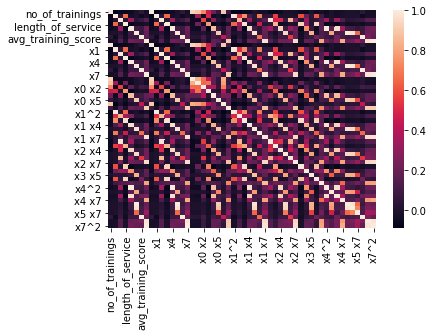

In [124]:

sns.heatmap(train_df.corr())

In [117]:
len(cols[train_df.var() > 0.05])

46

In [109]:
cols = train_df.select_dtypes(exclude = "object").columns

In [ ]:
train_df.filter()

#### Missing Values

- There are some null values in the education and previous_year_rating columns

In [73]:
#Total number of missing values
train_df.isna().sum()/train_df.shape[0]*100,2

(department              0.00
 region                  0.00
 education               4.40
 gender                  0.00
 recruitment_channel     0.00
 no_of_trainings         0.00
 age                     0.00
 previous_year_rating    7.52
 length_of_service       0.00
 KPIs_met >80%           0.00
 awards_won?             0.00
 avg_training_score      0.00
 is_promoted             0.00
 dtype: float64,
 2)

In [78]:
test_df.isna().sum()/test_df.shape[0]*100

department              0.00
region                  0.00
education               4.40
gender                  0.00
recruitment_channel     0.00
no_of_trainings         0.00
age                     0.00
previous_year_rating    7.71
length_of_service       0.00
KPIs_met >80%           0.00
awards_won?             0.00
avg_training_score      0.00
dtype: float64

##### Imputing Missing Values

In [273]:
#Imputing the missing values with median value for the previous_year_rating column in train and test dataset 
median  =  train_df["previous_year_rating"].median()
train_df["previous_year_rating"].fillna(value = median, inplace = True)
test_df["previous_year_rating"].fillna(value = median, inplace = True)

#### Data statistics

In [177]:
#Some description of the numeric data
train_df.select_dtypes(exclude = "object").describe()

,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.00,54808.00,54808.00,54808.00,54808.00,54808.00,54808.00,54808.00
mean,1.25,34.80,3.30,5.87,0.35,0.02,63.39,0.09
std,0.61,7.66,1.21,4.27,0.48,0.15,13.37,0.28
min,1.00,20.00,1.00,1.00,0.00,0.00,39.00,0.00
25%,1.00,29.00,3.00,3.00,0.00,0.00,51.00,0.00
50%,1.00,33.00,3.00,5.00,0.00,0.00,60.00,0.00
75%,1.00,39.00,4.00,7.00,1.00,0.00,76.00,0.00
max,10.00,60.00,5.00,37.00,1.00,1.00,99.00,1.00


In [587]:
train_df.dtypes

department               object
region                   object
education                object
gender                   object
recruitment_channel      object
no_of_trainings           int64
age                       int64
previous_year_rating    float64
length_of_service         int64
KPIs_met >80%             int64
awards_won?               int64
avg_training_score        int64
dtype: object

In [178]:
#Brief description of the object data
train_df.select_dtypes(include = "object").describe()

,department,region,education,gender,recruitment_channel
count,54808,54808,52399,54808,54808
unique,9,34,3,2,3
top,Sales & Marketing,region_2,Bachelor's,m,other
freq,16840,12343,36669,38496,30446


In [179]:
train_df["education"].value_counts()

Bachelor's          36669
Master's & above    14925
Below Secondary       805
Name: education, dtype: int64

Imputing missing values in the education column based on the length of service. If the employee has served for less than 15 years we impute Bachelors and otherwise Master's and above.

In [180]:
#For length of service less than 15
mask = train_df[train_df["length_of_service"] < 15]
train_df.loc[mask.index[mask['education'].isna() == True],"education"] = "Bachelor's"
test_mask = test_df[test_df["length_of_service"] < 15]
test_df.loc[test_mask.index[test_mask['education'].isna() == True],"education"] = "Bachelor's"

#For length of service greater than or equal to 15
mask = train_df[train_df["length_of_service"] >= 15]
train_df.loc[mask.index[mask['education'].isna() == True],"education"] = "Master's & above"
test_mask = test_df[test_df["length_of_service"] >= 15]
test_df.loc[test_mask.index[test_mask['education'].isna() == True],"education"] = "Master's & above"


#### Binning few columns
Creating categorical columns for some numerical features to better learn relationships

In [181]:
cat_cols = train_df.select_dtypes(exclude = "number").columns

In [182]:
for col in cat_cols:
    print(f"\n-------{col}-------\n")
    print(train_df[col].value_counts())
    print(test_df[col].value_counts())


-------department-------

Sales & Marketing    16840
Operations           11348
Procurement           7138
Technology            7138
Analytics             5352
Finance               2536
HR                    2418
Legal                 1039
R&D                    999
Name: department, dtype: int64
Sales & Marketing    7315
Operations           4764
Procurement          3020
Technology           3011
Analytics            2319
Finance              1091
HR                   1085
Legal                 445
R&D                   440
Name: department, dtype: int64

-------region-------

region_2     12343
region_22     6428
region_7      4843
region_15     2808
region_13     2648
region_26     2260
region_31     1935
region_4      1703
region_27     1659
region_16     1465
region_28     1318
region_11     1315
region_23     1175
region_29      994
region_32      945
region_19      874
region_20      850
region_14      827
region_25      819
region_17      796
region_5       766
region_6    

In [183]:
train_df.describe()

,no_of_trainings,age,previous_year_rating,length_of_service,KPIs_met >80%,awards_won?,avg_training_score,is_promoted
count,54808.00,54808.00,54808.00,54808.00,54808.00,54808.00,54808.00,54808.00
mean,1.25,34.80,3.30,5.87,0.35,0.02,63.39,0.09
std,0.61,7.66,1.21,4.27,0.48,0.15,13.37,0.28
min,1.00,20.00,1.00,1.00,0.00,0.00,39.00,0.00
25%,1.00,29.00,3.00,3.00,0.00,0.00,51.00,0.00
50%,1.00,33.00,3.00,5.00,0.00,0.00,60.00,0.00
75%,1.00,39.00,4.00,7.00,1.00,0.00,76.00,0.00
max,10.00,60.00,5.00,37.00,1.00,1.00,99.00,1.00


#### Univariate Analysis

##### Plot 1

In [184]:
#Subplot Initiation
fig = make_subplots(rows = 3, cols = 2, vertical_spacing= 0.2 ,
                   subplot_titles=("Education", "Department", "Gender", "Recruitment Channel", "Region"),
                   specs=[[{}, {}], [{},{}],
                   [{"colspan": 2}, None]],) 

#Subplot 1
fig.add_trace(go.Histogram(x = train_df["education"], name = "Education", histnorm = "percent"), row = 1, col = 1)

#Subplot 2
fig.add_trace(go.Histogram(x = train_df["department"], name = "Department", histnorm = "percent"), row = 1, col = 2)

#Subplot 3
fig.add_trace(go.Histogram(x = train_df["gender"], name = "Gender", histnorm = "percent"), row = 2, col = 1)

#Subplot 4
fig.add_trace(go.Histogram(x = train_df["recruitment_channel"], name = "Recruitment Channel", histnorm = "percent"), row = 2, col = 2)

#Subplot 4
fig.add_trace(go.Histogram(x = train_df["region"], name = "Region", histnorm = "percent"), row = 3, col = 1)

#Update layout
fig.update_layout(height=700, showlegend=False)

- Approximately 70% of the candidates hold a Bachelor's Degree whereas a small percentage of candidates have no college degree.
- There is a huge gender gap between the candidates. More than 70% of the candidates are male.
- Most of candidates are from the sales and operations department and very few from R&D and legal department. 
- Very few candidates are shortlisted via referrals whereas a large portion of them are shortlisted via sourcing.
- Candidates from Regions -2, 7 and 33 form majority of the pool of the shortlisted candidates.

##### Plot 2

In [185]:
#Subplot initiation
fig = make_subplots(rows = 2, cols = 2, vertical_spacing= 0.15 ,
                   subplot_titles=("No. of Trainings", "KPIs met > 80%", "Previous Year Ratings", "Length of Service",
                                  "Average Training Score", "Awards won", "Age", "Is Promoted"),)
#Subplot 1
fig.add_trace(go.Histogram(x = train_df["no_of_trainings"], name = "No. of Trainings", histnorm = "percent"), row = 1, col = 1)

#Subplot 2
fig.add_trace(go.Histogram(x = train_df["KPIs_met >80%"], name = "KPIs met > 80%", histnorm = "percent"), row = 1, col = 2)

#Subplot 3
fig.add_trace(go.Histogram(x = train_df["previous_year_rating"], name = "Previous Year Rating", histnorm = "percent"), row = 2, col = 1)

# #Sublplot 4
# fig.add_trace(go.Histogram(x = train_df["cat_length_of_service"], name = "Length of Service", histnorm = "percent"), row = 2, col = 2)


In [186]:
##Subplot Initiation
fig = make_subplots(rows = 2, cols = 2, vertical_spacing= 0.15 ,
                   subplot_titles=("Average Training Score", "Awards won", "Age", "Is Promoted"),)

#Subplot 1
# fig.add_trace(go.Histogram(x = train_df["cat_avg_training_score"], name = "Average Training Score", histnorm = "percent"), row = 1, col = 1)

#Subplot 2
fig.add_trace(go.Histogram(x = train_df["awards_won?"], name = "Awards Won", histnorm = "percent"), row = 1, col = 2)

#Subplot 3
# fig.add_trace(go.Histogram(x = train_df["cat_age"], name = "Age", histnorm = "percent"), row = 2, col = 1)

#Subplot 4
fig.add_trace(go.Histogram(x = train_df["is_promoted"], name = "Is Promoted"), row = 2, col =2)

#fig.update_layout(height=1000, showlegend=False)

#### Bivariate Analysis of features

##### Plot 3 
Using the target variable "is_promoted " as hue to better understand the differences between candidates getting promoted vs those not getting promoted.

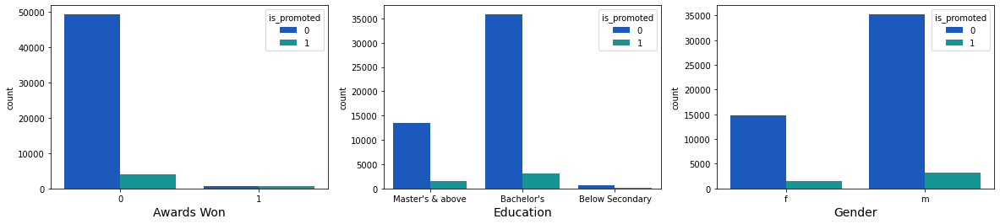

In [187]:
plt.figure(figsize = (20,4))
#Subplot 1
plt.subplot(1,3,1)
sn.countplot(x = "awards_won?", hue ="is_promoted", data=train_df, palette = ("winter"))
plt.xlabel("Awards Won", fontsize = 14)
#Subplot 2
plt.subplot(1,3,2)
sn.countplot(x = "education", hue ="is_promoted", data=train_df, palette = ("winter"))
plt.xlabel("Education", fontsize = 14)
#Subplot 3
plt.subplot(1,3,3)
sn.countplot(x = "gender", hue ="is_promoted", data=train_df, palette = ("winter"))
plt.xlabel("Gender", fontsize = 14)
plt.show()

- People who won awards have certainly received a promotion making it a strong indicator of whether a candidate is likely to get a promotion or not.
- There is no significant impact of gender on a candidate receiving a promotion.
- The percentage of candidates getting a promotion is higher for those with a Master's degree.

##### Plot 4

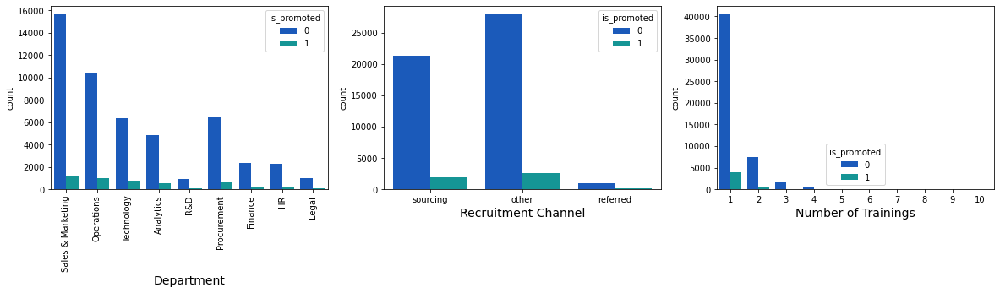

In [188]:
plt.figure(figsize = (20,4))
#Subplot 1
plt.subplot(1,3,1)
sn.countplot(x = "department", hue ="is_promoted", data=train_df, palette = ("winter"))
plt.xticks(rotation = 90)
plt.xlabel("Department", fontsize = 14)

#Subplot 2
plt.subplot(1,3,2)
sn.countplot(x = "recruitment_channel", hue ="is_promoted", data=train_df, palette = ("winter"))
plt.xlabel("Recruitment Channel", fontsize = 14)

#Subplot 3
plt.subplot(1,3,3)
sn.countplot(x = "no_of_trainings", hue ="is_promoted", data=train_df, palette = ("winter"))
plt.xlabel("Number of Trainings", fontsize = 14)
plt.show()

- A good number of promotions were received by candidates from Operations, Technology, Analytics, Procurement and Sales.

##### Plot 5

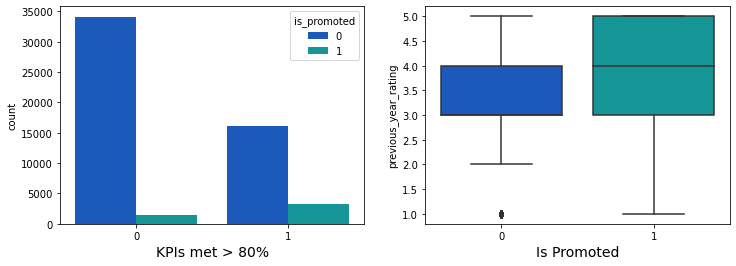

In [189]:
#Subplot 1
plt.figure(figsize = (12,4))
plt.subplot(1,2,1)
sn.countplot(x = "KPIs_met >80%", hue ="is_promoted", data=train_df, palette = ("winter"))
plt.xlabel("KPIs met > 80%", fontsize = 14)

#Subplot 2
plt.subplot(1,2,2)
sn.boxplot(y = "previous_year_rating", x ="is_promoted", data=train_df, palette = ("winter"))
plt.xlabel("Is Promoted", fontsize = 14)

plt.show()

- Approximately 20% of the candidates who met more than 80% of their KPIs were offered promotion in comparison to only 5-7% of those who did not meet 80% of their KPIs making the former more likely to receive a promotion.
- Also candidates who received promotions had good previous year scores.


##### Plot 6

In [190]:
# plt.figure(figsize = (20,4))
# #subplot 1
# plt.subplot(1,3,1)
# sn.countplot(x = "cat_age", hue ="is_promoted", data=train_df, palette = ("winter"))
# plt.xlabel("Age", fontsize = 14)

# #Subplot 2
# plt.subplot(1,3,2)
# sn.countplot(x = "cat_length_of_service", hue ="is_promoted", data=train_df, palette = ("winter"))
# plt.xlabel("Length of Service", fontsize = 14)

# #Subplot 3
# plt.subplot(1,3,3)
# sn.countplot(x = "cat_avg_training_score", hue ="is_promoted", data=train_df, palette = ("winter"))
# plt.xlabel("Average Training Score", fontsize = 14)
# plt.show()

- Higher the training score better the likelihood of getting promoted.
- Length of service and age do not seem to a distinguishing factor.

##### Plot 7 

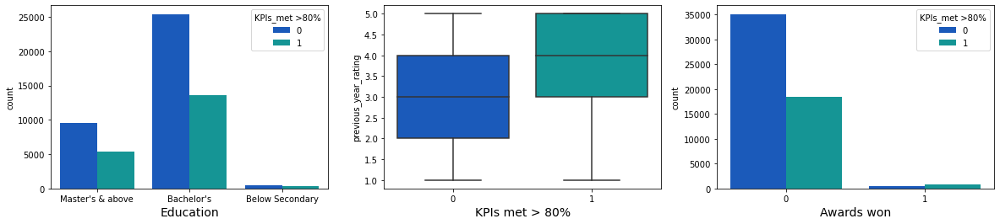

In [191]:
plt.figure(figsize = (20,4))
#Subplot 1
plt.subplot(1,3,1)
sn.countplot(x = "education", hue ="KPIs_met >80%", data=train_df, palette = ("winter"))
plt.xlabel("Education", fontsize = 14)

#Subplot 2
plt.subplot(1,3,2)
sn.boxplot(y = "previous_year_rating", x ="KPIs_met >80%", data=train_df, palette = ("winter"))
plt.xlabel("KPIs met > 80%", fontsize = 14)

#Subplot 3
plt.subplot(1,3,3)
sn.countplot(x = "awards_won?", hue ="KPIs_met >80%", data=train_df, palette = ("winter"))
plt.xlabel("Awards won", fontsize = 14)

plt.show()

- People with higher previous year's score are more likely to meet more than 80% of their KPIs.

##### Plot 8

In [192]:
# plt.figure(figsize = (20,4))
# #Subplot 1
# plt.subplot(1,3,1)
# sn.countplot(x = "cat_age", hue ="KPIs_met >80%", data=train_df, palette = ("winter"))
# plt.xlabel("Age", fontsize = 14)

# #Subplot 2
# plt.subplot(1,3,2)
# sn.countplot(x = "cat_length_of_service", hue ="KPIs_met >80%", data=train_df, palette = ("winter"))
# plt.xlabel("Length of Service", fontsize = 14)

# #Subplot 3
# plt.subplot(1,3,3)
# sn.countplot(x = "cat_avg_training_score", hue ="KPIs_met >80%", data=train_df, palette = ("winter"))
# plt.xlabel("Average Training Score", fontsize = 14)
# plt.show()

- Candidates with higher training score were also more likely to achieve more than 80% of their KPIs.

### Model Building

#### Separating dependent and independent variables

In [193]:
#Dividing the data_set into x and y
y = train_df.pop("is_promoted")
X = train_df
test_X = test_df.copy()

#### Dropping useless features

In [194]:
# #Dropping few features
# to_drop = ["age", "avg_training_score", "length_of_service"] #Since we have already created categorical columns for these features
# X.drop(columns = to_drop, inplace = True)
# test_df.drop(columns = to_drop, inplace = True)

#### Creating dummy variables

In [195]:
#Creating one hot vectors for categorical data

to_encode = X.select_dtypes(exclude = "number").columns
X = pd.get_dummies(X, columns = to_encode, drop_first = True )
test_df = pd.get_dummies(test_df, columns = to_encode, drop_first = True)

#### Creating training and validation sets
validation size kept as 20% percent of the total examples

In [421]:
#splitting the dataset into train and test set
train_X, val_X, train_y, val_y = train_test_split(X, y, test_size = 0.2, random_state = 42)

#### Scaling the dataframes using MixMax Scaler

In [422]:
def scale(scaler, train_x, val_X, test_df):
    train_X.loc[:,:] = scaler.fit_transform(train_X)
    val_X.loc[:,:] = scaler.transform(val_X)
    test_df.loc[:,:] = scaler.transform(test_df)

In [423]:
scaler = preprocessing.RobustScaler()
scale(scaler, train_X, val_X, test_df)

### PCA to reduce the number of features
We use Principal component analysis to transform the input space in order to obtain the components that help explain maximum variance in our training dataset.

In [424]:
#reducing the number of features
dic = {}
num_of_features = train_X.shape[1]
for i in range(10, num_of_features, 5):
    pca = PCA(n_components = i, random_state = 42).fit(train_X)
    dic[i] = np.sum(pca.explained_variance_ratio_)

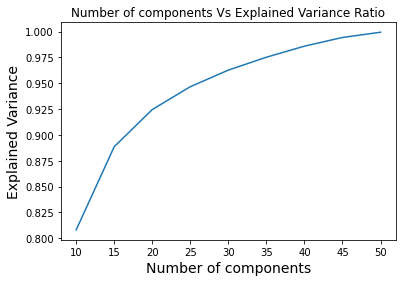

In [425]:
#Plotting a graph between the number of components and explained variance
no_of_components = list(dic.keys())
explained_variance = list(dic.values())
plt.plot(no_of_components, explained_variance)
plt.xlabel("Number of components", fontsize = 14)
plt.ylabel("Explained Variance", fontsize = 14)
plt.title("Number of components Vs Explained Variance Ratio")
plt.show()

In [426]:
#Reducing the number of components to those that are able to explain 95% of the variance in the training dataset
pca = PCA(0.95)
train_X_transformed = pd.DataFrame(pca.fit_transform(train_X), index = train_X.index)

In [427]:
train_X_transformed.shape

(43846, 26)

Using PCA we were able to explain 95% of the variance in the training data using approximately 30-35 features.

In [428]:
#Transforming the val_X and test_df set also
val_X_transformed = pd.DataFrame(pca.transform(val_X), index = val_X.index)
test_df_transformed = pd.DataFrame(pca.transform(test_df), index = test_df.index)

#### Functions to plot  and print the validation metrics

In [429]:
from utils import *

In [430]:
#Storing each models results in a data frame for comparison
results_df = pd.DataFrame( columns = ["Algorithm","f1_train", "f1_test", 
                                      "Recall_train", "Recall_test", 
                                      "Precision_train", "Precision_test", "Cut_off_prob"])
   

In [431]:
def show_confusion(y_true, y_pred):
    matrix = confusion_matrix(y_true, y_pred)
    confusion = pd.DataFrame(matrix, index = [["Actual","Actual"], ["Not_promoted", "Promoted"]], columns = ["Not_promoted", "Promoted"])
    return confusion

In [432]:
#Method to return the threshold value that provides maximum F1 Score
def get_optimal_threshold(y_true, y_pred_prob):
    thresholds = [i/100 for i in range(0, 100, 5)]
    f1_scores = []
    optimal_threshold = 0
    max_f1_score = 0
    for value in thresholds:
        y_pred = [1 if i >= value else 0 for i in y_pred_prob]
        f1 = round(f1_score(y_true, y_pred), 2)
        f1_scores.append(f1)
        if f1 >max_f1_score:
            max_f1_score = f1
            optimal_threshold = value
    return optimal_threshold

### Model 1

In [433]:
#Training a model using Logistic Regression ALgorithm
lr = LogisticRegression(max_iter=500).fit(train_X_transformed, train_y)

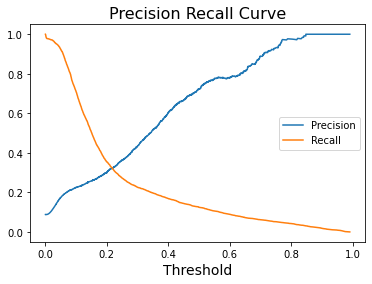

In [434]:
#Predicting the probabilties and plotting a curve
train_pred_prob = lr.predict_proba(train_X_transformed)[:,1]
plot_precision_recall_curve(train_y, train_pred_prob)

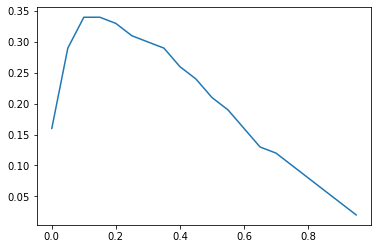

In [435]:
#Plotting a F1_curve
plot_f1_curve(train_y, train_pred_prob)

In [436]:
#Making Classification at the optimal threshold
optimal_threshold = get_optimal_threshold(train_y,train_pred_prob)
train_pred = [1 if i >= optimal_threshold else 0 for i in train_pred_prob]

In [437]:
#Confusion Matrix
show_confusion(train_y, train_pred)

Not_promoted  Promoted
Actual Not_promoted         30859      9227
       Promoted              1082      2678

In [438]:
precision_train, recall_train, f1_train  = print_all_score(train_y, train_pred, "train")

The precision score on the train set is 0.22
The recall score on the train set is 0.71
The F1 score on the train set is 0.34


In [439]:
val_pred_prob = lr.predict_proba(val_X_transformed)[:,1]
#Making Classification at optimal threshold
val_pred = [1 if i >= optimal_threshold else 0 for i in val_pred_prob]

In [440]:
precision_val, recall_val, f1_val = print_all_score(val_y, val_pred, "val")

The precision score on the val set is 0.22
The recall score on the val set is 0.73
The F1 score on the val set is 0.34


In [441]:
#Updating the global records table for Logistic Regression
results_df = add_results(results_df, "Logistic Regression with Class_Imb", f1_train, f1_val, 
                         recall_train, recall_val, precision_train, precision_val, 0.1)
results_df

,Algorithm,f1_train,f1_test,Recall_train,Recall_test,Precision_train,Precision_test,Cut_off_prob
0,Logistic Regression with Class_Imb,0.34,0.34,0.71,0.73,0.22,0.22,0.1


In [442]:
test_pred_prob = lr.predict_proba(test_df_transformed)[:,1]
test_pred = [1 if i >= optimal_threshold else 0 for i in test_pred_prob]

In [443]:
test_results = pd.DataFrame(test_pred, index = test_df.index, columns = ['is_promoted'])

In [444]:
#Saving the predictions on the test set
path = os.curdir
save_path = os.path.join(path, "test_results.csv")
test_results.to_csv(save_path)

In [445]:
train_y.value_counts()

0    40086
1     3760
Name: is_promoted, dtype: int64

### Model 1B - LR without PCA

In [446]:
#Training a model using Logistic Regression ALgorithm
lr = LogisticRegression(max_iter=500).fit(train_X, train_y)

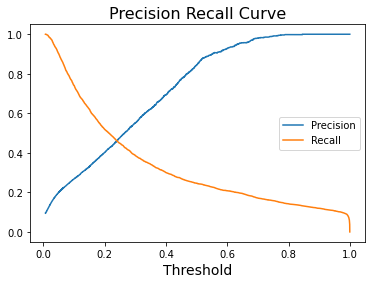

In [447]:
#Predicting the probabilties and plotting a curve
train_pred_prob = lr.predict_proba(train_X)[:,1]
plot_precision_recall_curve(train_y, train_pred_prob)

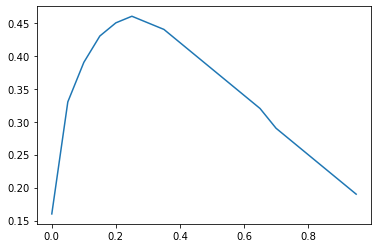

In [448]:
#Plotting a F1_curve
plot_f1_curve(train_y, train_pred_prob)

In [449]:
#Making Classification at the optimal threshold
optimal_threshold = get_optimal_threshold(train_y,train_pred_prob)
train_pred = [1 if i >= optimal_threshold else 0 for i in train_pred_prob]

In [450]:
#Confusion Matrix
show_confusion(train_y, train_pred)

Not_promoted  Promoted
Actual Not_promoted         38244      1842
       Promoted              2076      1684

In [451]:
precision_train, recall_train, f1_train  = print_all_score(train_y, train_pred, "train")

The precision score on the train set is 0.48
The recall score on the train set is 0.45
The F1 score on the train set is 0.46


In [452]:
val_pred_prob = lr.predict_proba(val_X)[:,1]
#Making Classification at optimal threshold
val_pred = [1 if i >= optimal_threshold else 0 for i in val_pred_prob]

In [453]:
precision_val, recall_val, f1_val = print_all_score(val_y, val_pred, "val")

The precision score on the val set is 0.46
The recall score on the val set is 0.44
The F1 score on the val set is 0.45


In [454]:
#Updating the global records table for Logistic Regression
results_df = add_results(results_df, "Logistic Regression with Class_Imb", f1_train, f1_val, 
                         recall_train, recall_val, precision_train, precision_val, 0.1)
results_df

,Algorithm,f1_train,f1_test,Recall_train,Recall_test,Precision_train,Precision_test,Cut_off_prob
0,Logistic Regression with Class_Imb,0.34,0.34,0.71,0.73,0.22,0.22,0.1
1,Logistic Regression with Class_Imb,0.46,0.45,0.45,0.44,0.48,0.46,0.1


In [455]:
test_pred_prob = lr.predict_proba(test_df)[:,1]
test_pred = [1 if i >= optimal_threshold else 0 for i in test_pred_prob]

In [456]:
test_results = pd.DataFrame(test_pred, index = test_df.index, columns = ['is_promoted'])

In [457]:
#Saving the predictions on the test set
path = os.curdir
save_path = os.path.join(path, "test_results.csv")
test_results.to_csv(save_path)

In [458]:
train_y.value_counts()

0    40086
1     3760
Name: is_promoted, dtype: int64

### Model 1C - LR with class weights 

In [459]:
#Training a model using Logistic Regression ALgorithm
lr = LogisticRegression(max_iter=500, class_weight={0:1,1:3}).fit(train_X, train_y)

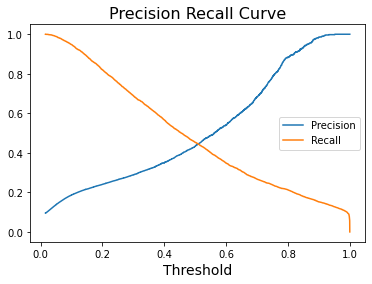

In [460]:
#Predicting the probabilties and plotting a curve
train_pred_prob = lr.predict_proba(train_X)[:,1]
plot_precision_recall_curve(train_y, train_pred_prob)

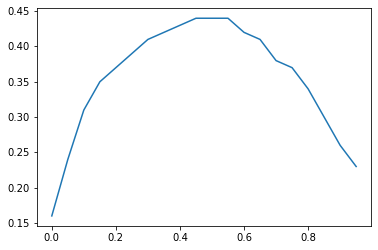

In [461]:
#Plotting a F1_curve
plot_f1_curve(train_y, train_pred_prob)

In [462]:
#Making Classification at the optimal threshold
optimal_threshold = get_optimal_threshold(train_y,train_pred_prob)
train_pred = [1 if i >= optimal_threshold else 0 for i in train_pred_prob]

In [463]:
#Confusion Matrix
show_confusion(train_y, train_pred)

Not_promoted  Promoted
Actual Not_promoted         37117      2969
       Promoted              1861      1899

In [464]:
precision_train, recall_train, f1_train  = print_all_score(train_y, train_pred, "train")

The precision score on the train set is 0.39
The recall score on the train set is 0.51
The F1 score on the train set is 0.44


In [465]:
val_pred_prob = lr.predict_proba(val_X)[:,1]
#Making Classification at optimal threshold
val_pred = [1 if i >= optimal_threshold else 0 for i in val_pred_prob]

In [466]:
precision_val, recall_val, f1_val = print_all_score(val_y, val_pred, "val")

The precision score on the val set is 0.38
The recall score on the val set is 0.5
The F1 score on the val set is 0.43


In [467]:
#Updating the global records table for Logistic Regression
results_df = add_results(results_df, "Logistic Regression with Class_Imb", f1_train, f1_val, 
                         recall_train, recall_val, precision_train, precision_val, 0.1)
results_df

,Algorithm,f1_train,f1_test,Recall_train,Recall_test,Precision_train,Precision_test,Cut_off_prob
0,Logistic Regression with Class_Imb,0.34,0.34,0.71,0.73,0.22,0.22,0.1
1,Logistic Regression with Class_Imb,0.46,0.45,0.45,0.44,0.48,0.46,0.1
2,Logistic Regression with Class_Imb,0.44,0.43,0.51,0.50,0.39,0.38,0.1


In [419]:
test_pred_prob = lr.predict_proba(test_df)[:,1]
test_pred = [1 if i >= optimal_threshold else 0 for i in test_pred_prob]

In [420]:
test_results = pd.DataFrame(test_pred, index = test_df.index, columns = ['is_promoted'])

In [370]:
#Saving the predictions on the test set
path = os.curdir
save_path = os.path.join(path, "test_results.csv")
test_results.to_csv(save_path)

In [371]:
train_y.value_counts()

0    40086
1     3760
Name: is_promoted, dtype: int64

Logistic Regression gave best performance without performing PCA and without class weights, using MinMaxScaler

### Support Vector Machine - Model 2A

In [70]:
parameters = {
    "C": [1.0,0.8,0.6],
    "gamma": ["scale", "auto"],
    "class_weight": [{0: 0.1, 1: 0.9}, {0: 0.25, 1: 0.75}]
}

grid_search = GridSearchCV(estimator = SVC(), param_grid=parameters, n_jobs = -1, scoring = "f1", return_train_score = True)

In [71]:
grid_search.fit(train_X_transformed, train_y)

GridSearchCV(estimator=SVC(), n_jobs=-1,
             param_grid={'C': [1.0, 0.8, 0.6],
                         'class_weight': [{0: 0.1, 1: 0.9}, {0: 0.25, 1: 0.75}],
                         'gamma': ['scale', 'auto']},
             return_train_score=True, scoring='f1')

In [75]:
grid_search.best_params_

{'C': 1.0, 'class_weight': {0: 0.25, 1: 0.75}, 'gamma': 'scale'}

In [73]:
grid_search.best_score_

0.36863253051231776

In [468]:
#Training a model using Logistic Regression ALgorithm
svm = SVC().fit(train_X, train_y)

In [469]:
#Predicting the probabilties and plotting a curve
train_pred = svm.predict(train_X)

In [470]:
#Confusion Matrix
show_confusion(train_y, train_pred)

Not_promoted  Promoted
Actual Not_promoted         40082         4
       Promoted              3019       741

In [471]:
precision_train, recall_train, f1_train = print_all_score(train_y, train_pred, "train")

The precision score on the train set is 0.99
The recall score on the train set is 0.2
The F1 score on the train set is 0.33


In [472]:
val_pred = svm.predict(val_X)

In [473]:
precision_val, recall_val, f1_val = print_all_score(val_y, val_pred, "val")

The precision score on the val set is 0.98
The recall score on the val set is 0.18
The F1 score on the val set is 0.31


In [474]:
#Confusion Matrix
show_confusion(val_y, val_pred)

Not_promoted  Promoted
Actual Not_promoted         10051         3
       Promoted               743       165

In [475]:
#Updating the global records table for SVM
algorithm = "Support Vector Machine (no prob)"
if results_df["Algorithm"].get(results_df.shape[0]-1) != algorithm: 
    results_df = add_results(results_df, algorithm, f1_train, f1_val, 
                             recall_train, recall_val, precision_train, precision_val, "-")
results_df

,Algorithm,f1_train,f1_test,Recall_train,Recall_test,Precision_train,Precision_test,Cut_off_prob
0,Logistic Regression with Class_Imb,0.34,0.34,0.71,0.73,0.22,0.22,0.1
1,Logistic Regression with Class_Imb,0.46,0.45,0.45,0.44,0.48,0.46,0.1
2,Logistic Regression with Class_Imb,0.44,0.43,0.51,0.50,0.39,0.38,0.1
3,Support Vector Machine (no prob),0.33,0.31,0.20,0.18,0.99,0.98,-


In [ ]:
#Setting data points as 1 whose predicted probability is greater than or equal to optimal threshold
test_pred = svm.predict(test_df_transformed)[:,1]

In [ ]:
#Creating a dataframe to store the test predictions
test_results = pd.DataFrame(test_pred, index = test_df.index, columns = ["is_promoted"])

In [ ]:
#Saving the predictions on the test set
save_path = os.path.join(path, "test_results.csv")
test_results.to_csv(save_path )

### Model 2B - SVM using class weights

In [523]:
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV
from sklearn.model_selection import StratifiedKFold
from scipy.stats import uniform, reciprocal

In [558]:
parameters = {
    "C": np.linspace(0.002,10, 13),
    "gamma": np.linspace(0.002,10, 13),
    "class_weight": [{0: 0.1, 1: 0.9}, {0: 0.25, 1: 0.75}, {0:1,0:3}]
}

kFold = StratifiedKFold()

half_search =  HalvingGridSearchCV(estimator = SVC(), param_grid=parameters, n_jobs = 8, scoring = "f1", cv = kFold, return_train_score = True)

In [561]:
half_search.fit(train_X, train_y)

HalvingGridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
                    estimator=SVC(), n_jobs=8,
                    param_grid={'C': array([2.00000000e-03, 8.35166667e-01, 1.66833333e+00, 2.50150000e+00,
       3.33466667e+00, 4.16783333e+00, 5.00100000e+00, 5.83416667e+00,
       6.66733333e+00, 7.50050000e+00, 8.33366667e+00, 9.16683333e+00,
       1.00000000e+01]),
                                'class_weight': [{0: 0.1, 1: 0.9},
                                                 {0: 0.25, 1: 0.75}, {0: 3}],
                                'gamma': array([2.00000000e-03, 8.35166667e-01, 1.66833333e+00, 2.50150000e+00,
       3.33466667e+00, 4.16783333e+00, 5.00100000e+00, 5.83416667e+00,
       6.66733333e+00, 7.50050000e+00, 8.33366667e+00, 9.16683333e+00,
       1.00000000e+01])},
                    refit=<function _refit_callable at 0x000001E0990E7EE0>,
                    scoring='f1')

In [562]:
beepy.beep('wilhelm')

In [563]:
half_search.best_params_

{'C': 8.333666666666668, 'class_weight': {0: 0.1, 1: 0.9}, 'gamma': 0.002}

In [564]:
half_search.best_score_

0.30360335741403854

In [565]:
#Training a model using Logistic Regression ALgorithm
svm = SVC(**half_search.best_params_).fit(train_X, train_y)

In [566]:
#Predicting the probabilties and plotting a curve
train_pred = svm.predict(train_X)

In [567]:
#Confusion Matrix
show_confusion(train_y, train_pred)

Not_promoted  Promoted
Actual Not_promoted         28069     12017
       Promoted               677      3083

In [568]:
precision_train, recall_train, f1_train = print_all_score(train_y, train_pred, "train")

The precision score on the train set is 0.2
The recall score on the train set is 0.82
The F1 score on the train set is 0.33


In [569]:
val_pred = svm.predict(val_X)

In [570]:
precision_val, recall_val, f1_val = print_all_score(val_y, val_pred, "val")

The precision score on the val set is 0.2
The recall score on the val set is 0.83
The F1 score on the val set is 0.33


In [571]:
#Confusion Matrix
show_confusion(val_y, val_pred)

Not_promoted  Promoted
Actual Not_promoted          7082      2972
       Promoted               155       753

In [572]:
#Updating the global records table for SVM
algorithm = "Support Vector Machine (weights)"
if results_df["Algorithm"].get(results_df.shape[0]-1) != algorithm: 
    results_df = add_results(results_df, algorithm, f1_train, f1_val, 
                             recall_train, recall_val, precision_train, precision_val, "-")
results_df

,Algorithm,f1_train,f1_test,Recall_train,Recall_test,Precision_train,Precision_test,Cut_off_prob
0,Logistic Regression with Class_Imb,0.34,0.34,0.71,0.73,0.22,0.22,0.1
1,Logistic Regression with Class_Imb,0.46,0.45,0.45,0.44,0.48,0.46,0.1
2,Logistic Regression with Class_Imb,0.44,0.43,0.51,0.50,0.39,0.38,0.1
3,Support Vector Machine (no prob),0.33,0.31,0.20,0.18,0.99,0.98,-
4,Support Vector Machine (weights),0.58,0.48,0.48,0.39,0.74,0.62,-


In [491]:
#Setting data points as 1 whose predicted probability is greater than or equal to optimal threshold
test_pred = svm.predict(test_df)

In [492]:
#Creating a dataframe to store the test predictions
test_results = pd.DataFrame(test_pred, index = test_df.index, columns = ["is_promoted"])

In [493]:
#Saving the predictions on the test set
save_path = os.path.join(path, "test_results.csv")
test_results.to_csv(save_path )

### Model 2C - SVM with probability

In [494]:
#Training a model using Logistic Regression ALgorithm
svm = SVC(probability = True, class_weight = {0:1,1:3}).fit(train_X, train_y)

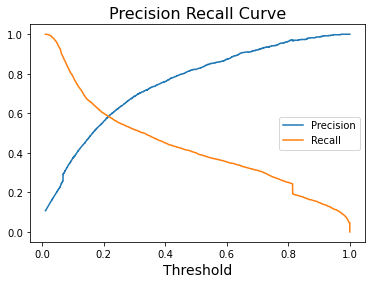

In [495]:
#Predicting the probabilties and plotting a curve
train_pred_prob = svm.predict_proba(train_X)[:,1]
plot_precision_recall_curve(train_y, train_pred_prob)

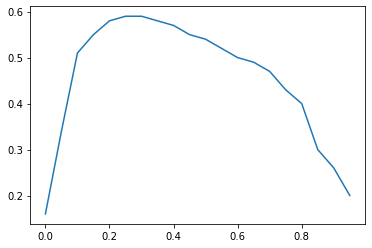

In [496]:
#Plotting a F1_curve
plot_f1_curve(train_y, train_pred_prob)

In [497]:
#Making Classification at the optimal threshold
optimal_threshold = get_optimal_threshold(train_y,train_pred_prob)
train_pred = [1 if i >= optimal_threshold else 0 for i in train_pred_prob]

In [498]:
#Confusion Matrix
show_confusion(train_y, train_pred)

Not_promoted  Promoted
Actual Not_promoted         38860      1226
       Promoted              1684      2076

In [499]:
precision_train, recall_train, f1_train  = print_all_score(train_y, train_pred, "train")

The precision score on the train set is 0.63
The recall score on the train set is 0.55
The F1 score on the train set is 0.59


In [500]:
val_pred_prob = lr.predict_proba(val_X)[:,1]
#Making Classification at optimal threshold
val_pred = [1 if i >= optimal_threshold else 0 for i in val_pred_prob]

In [501]:
precision_val, recall_val, f1_val = print_all_score(val_y, val_pred, "val")

The precision score on the val set is 0.26
The recall score on the val set is 0.77
The F1 score on the val set is 0.39


In [504]:
beepy.beep('wilhelm')

In [475]:
#Updating the global records table for SVM
algorithm = "Support Vector Machine (prob & weights)"
if results_df["Algorithm"].get(results_df.shape[0]-1) != algorithm: 
    results_df = add_results(results_df, algorithm, f1_train, f1_val, 
                             recall_train, recall_val, precision_train, precision_val, optimal_threshold)
results_df

,Algorithm,f1_train,f1_test,Recall_train,Recall_test,Precision_train,Precision_test,Cut_off_prob
0,Logistic Regression with Class_Imb,0.34,0.34,0.71,0.73,0.22,0.22,0.1
1,Logistic Regression with Class_Imb,0.46,0.45,0.45,0.44,0.48,0.46,0.1
2,Logistic Regression with Class_Imb,0.44,0.43,0.51,0.50,0.39,0.38,0.1
3,Support Vector Machine (no prob),0.33,0.31,0.20,0.18,0.99,0.98,-


In [ ]:
#Setting data points as 1 whose predicted probability is greater than or equal to optimal threshold
test_pred = svm.predict(test_df_transformed)[:,1]

In [ ]:
#Creating a dataframe to store the test predictions
test_results = pd.DataFrame(test_pred, index = test_df.index, columns = ["is_promoted"])

In [ ]:
#Saving the predictions on the test set
save_path = os.path.join(path, "test_results.csv")
test_results.to_csv(save_path )

### Model 4 - catBoost without categorical features

In [60]:
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import HalvingGridSearchCV
from catboost import CatBoostClassifier

In [178]:
params = {
    "learning_rate": [0.01,0.005,0.001],
    "l2_leaf_reg": [0.01,0.001],
    "depth": [4,6,8,10]
}

half_search  = HalvingGridSearchCV(CatBoostClassifier(early_stopping_rounds=5, cat_features = cat, 
                                                      class_weights = {0 : 0.25, 1: 0.75}), 
                                   param_grid=params, 
                                   scoring = 'f1', 
                                   n_jobs = -1)

In [179]:
half_search.fit(train_X, train_y)

0:	learn: 0.6834358	total: 50.9ms	remaining: 50.9s
1:	learn: 0.6739472	total: 127ms	remaining: 1m 3s
2:	learn: 0.6647677	total: 182ms	remaining: 1m
3:	learn: 0.6557667	total: 238ms	remaining: 59.3s
4:	learn: 0.6458401	total: 304ms	remaining: 1m
5:	learn: 0.6362827	total: 368ms	remaining: 1m
6:	learn: 0.6256224	total: 432ms	remaining: 1m 1s
7:	learn: 0.6153701	total: 501ms	remaining: 1m 2s
8:	learn: 0.6052700	total: 554ms	remaining: 1m
9:	learn: 0.5957616	total: 610ms	remaining: 1m
10:	learn: 0.5883953	total: 669ms	remaining: 1m
11:	learn: 0.5798255	total: 714ms	remaining: 58.8s
12:	learn: 0.5715868	total: 756ms	remaining: 57.4s
13:	learn: 0.5632493	total: 812ms	remaining: 57.2s
14:	learn: 0.5569021	total: 856ms	remaining: 56.2s
15:	learn: 0.5494568	total: 932ms	remaining: 57.3s
16:	learn: 0.5408460	total: 991ms	remaining: 57.3s
17:	learn: 0.5353842	total: 1.08s	remaining: 58.9s
18:	learn: 0.5303506	total: 1.15s	remaining: 59.1s
19:	learn: 0.5252401	total: 1.22s	remaining: 59.8s
20:	lea

164:	learn: 0.3495171	total: 11.6s	remaining: 58.5s
165:	learn: 0.3494657	total: 11.6s	remaining: 58.5s
166:	learn: 0.3492924	total: 11.8s	remaining: 58.7s
167:	learn: 0.3487817	total: 11.8s	remaining: 58.7s
168:	learn: 0.3486868	total: 11.9s	remaining: 58.6s
169:	learn: 0.3484860	total: 12s	remaining: 58.5s
170:	learn: 0.3483715	total: 12s	remaining: 58.4s
171:	learn: 0.3481809	total: 12.1s	remaining: 58.2s
172:	learn: 0.3480695	total: 12.2s	remaining: 58.3s
173:	learn: 0.3479219	total: 12.3s	remaining: 58.2s
174:	learn: 0.3476796	total: 12.3s	remaining: 58.1s
175:	learn: 0.3475454	total: 12.4s	remaining: 58.1s
176:	learn: 0.3474233	total: 12.5s	remaining: 58.1s
177:	learn: 0.3472758	total: 12.6s	remaining: 58.1s
178:	learn: 0.3471216	total: 12.6s	remaining: 58s
179:	learn: 0.3469476	total: 12.7s	remaining: 58s
180:	learn: 0.3467673	total: 12.8s	remaining: 57.8s
181:	learn: 0.3466937	total: 12.9s	remaining: 57.8s
182:	learn: 0.3465754	total: 12.9s	remaining: 57.8s
183:	learn: 0.346368

324:	learn: 0.3320639	total: 23.3s	remaining: 48.5s
325:	learn: 0.3320163	total: 23.4s	remaining: 48.4s
326:	learn: 0.3319379	total: 23.5s	remaining: 48.3s
327:	learn: 0.3318996	total: 23.5s	remaining: 48.2s
328:	learn: 0.3318554	total: 23.6s	remaining: 48.1s
329:	learn: 0.3318420	total: 23.7s	remaining: 48.1s
330:	learn: 0.3317649	total: 23.8s	remaining: 48.1s
331:	learn: 0.3316963	total: 23.9s	remaining: 48s
332:	learn: 0.3316398	total: 23.9s	remaining: 47.9s
333:	learn: 0.3315490	total: 24s	remaining: 47.9s
334:	learn: 0.3314807	total: 24.1s	remaining: 47.8s
335:	learn: 0.3312697	total: 24.2s	remaining: 47.8s
336:	learn: 0.3312245	total: 24.2s	remaining: 47.7s
337:	learn: 0.3311774	total: 24.3s	remaining: 47.6s
338:	learn: 0.3311071	total: 24.4s	remaining: 47.5s
339:	learn: 0.3310803	total: 24.4s	remaining: 47.4s
340:	learn: 0.3309634	total: 24.5s	remaining: 47.4s
341:	learn: 0.3309241	total: 24.6s	remaining: 47.3s
342:	learn: 0.3308866	total: 24.7s	remaining: 47.3s
343:	learn: 0.33

485:	learn: 0.3244685	total: 35.8s	remaining: 37.9s
486:	learn: 0.3244249	total: 35.9s	remaining: 37.8s
487:	learn: 0.3244239	total: 35.9s	remaining: 37.7s
488:	learn: 0.3243985	total: 36s	remaining: 37.6s
489:	learn: 0.3243566	total: 36.1s	remaining: 37.6s
490:	learn: 0.3243285	total: 36.2s	remaining: 37.5s
491:	learn: 0.3242902	total: 36.3s	remaining: 37.5s
492:	learn: 0.3242631	total: 36.4s	remaining: 37.4s
493:	learn: 0.3242358	total: 36.5s	remaining: 37.4s
494:	learn: 0.3241977	total: 36.6s	remaining: 37.3s
495:	learn: 0.3241674	total: 36.6s	remaining: 37.2s
496:	learn: 0.3241493	total: 36.7s	remaining: 37.2s
497:	learn: 0.3240975	total: 36.8s	remaining: 37.1s
498:	learn: 0.3240422	total: 36.9s	remaining: 37s
499:	learn: 0.3240237	total: 37s	remaining: 37s
500:	learn: 0.3239858	total: 37s	remaining: 36.9s
501:	learn: 0.3239347	total: 37.1s	remaining: 36.8s
502:	learn: 0.3239158	total: 37.2s	remaining: 36.8s
503:	learn: 0.3238617	total: 37.3s	remaining: 36.7s
504:	learn: 0.3238475	

646:	learn: 0.3196149	total: 48.5s	remaining: 26.5s
647:	learn: 0.3195956	total: 48.6s	remaining: 26.4s
648:	learn: 0.3195798	total: 48.6s	remaining: 26.3s
649:	learn: 0.3195597	total: 48.7s	remaining: 26.2s
650:	learn: 0.3195459	total: 48.8s	remaining: 26.1s
651:	learn: 0.3195295	total: 48.8s	remaining: 26.1s
652:	learn: 0.3195104	total: 48.9s	remaining: 26s
653:	learn: 0.3194886	total: 49s	remaining: 25.9s
654:	learn: 0.3194407	total: 49.1s	remaining: 25.9s
655:	learn: 0.3194112	total: 49.2s	remaining: 25.8s
656:	learn: 0.3193990	total: 49.3s	remaining: 25.7s
657:	learn: 0.3193667	total: 49.3s	remaining: 25.6s
658:	learn: 0.3193418	total: 49.4s	remaining: 25.6s
659:	learn: 0.3193065	total: 49.5s	remaining: 25.5s
660:	learn: 0.3192838	total: 49.6s	remaining: 25.4s
661:	learn: 0.3192440	total: 49.6s	remaining: 25.3s
662:	learn: 0.3192291	total: 49.7s	remaining: 25.3s
663:	learn: 0.3192259	total: 49.8s	remaining: 25.2s
664:	learn: 0.3192125	total: 49.9s	remaining: 25.1s
665:	learn: 0.31

807:	learn: 0.3155379	total: 1m	remaining: 14.4s
808:	learn: 0.3155131	total: 1m	remaining: 14.3s
809:	learn: 0.3154940	total: 1m	remaining: 14.3s
810:	learn: 0.3154556	total: 1m	remaining: 14.2s
811:	learn: 0.3154393	total: 1m 1s	remaining: 14.1s
812:	learn: 0.3154014	total: 1m 1s	remaining: 14.1s
813:	learn: 0.3153861	total: 1m 1s	remaining: 14s
814:	learn: 0.3153860	total: 1m 1s	remaining: 13.9s
815:	learn: 0.3153355	total: 1m 1s	remaining: 13.8s
816:	learn: 0.3153261	total: 1m 1s	remaining: 13.8s
817:	learn: 0.3152931	total: 1m 1s	remaining: 13.7s
818:	learn: 0.3152907	total: 1m 1s	remaining: 13.6s
819:	learn: 0.3152737	total: 1m 1s	remaining: 13.5s
820:	learn: 0.3151784	total: 1m 1s	remaining: 13.5s
821:	learn: 0.3151527	total: 1m 1s	remaining: 13.4s
822:	learn: 0.3150722	total: 1m 1s	remaining: 13.3s
823:	learn: 0.3150533	total: 1m 1s	remaining: 13.2s
824:	learn: 0.3150398	total: 1m 2s	remaining: 13.2s
825:	learn: 0.3149638	total: 1m 2s	remaining: 13.1s
826:	learn: 0.3149283	tota

967:	learn: 0.3115028	total: 1m 12s	remaining: 2.4s
968:	learn: 0.3114873	total: 1m 12s	remaining: 2.33s
969:	learn: 0.3114765	total: 1m 12s	remaining: 2.25s
970:	learn: 0.3114540	total: 1m 12s	remaining: 2.18s
971:	learn: 0.3114304	total: 1m 12s	remaining: 2.1s
972:	learn: 0.3114111	total: 1m 13s	remaining: 2.03s
973:	learn: 0.3114064	total: 1m 13s	remaining: 1.95s
974:	learn: 0.3113849	total: 1m 13s	remaining: 1.88s
975:	learn: 0.3113565	total: 1m 13s	remaining: 1.8s
976:	learn: 0.3113227	total: 1m 13s	remaining: 1.73s
977:	learn: 0.3112973	total: 1m 13s	remaining: 1.65s
978:	learn: 0.3112845	total: 1m 13s	remaining: 1.57s
979:	learn: 0.3112668	total: 1m 13s	remaining: 1.5s
980:	learn: 0.3112522	total: 1m 13s	remaining: 1.43s
981:	learn: 0.3112310	total: 1m 13s	remaining: 1.35s
982:	learn: 0.3112042	total: 1m 13s	remaining: 1.27s
983:	learn: 0.3111933	total: 1m 13s	remaining: 1.2s
984:	learn: 0.3111846	total: 1m 13s	remaining: 1.12s
985:	learn: 0.3111625	total: 1m 13s	remaining: 1.05

HalvingGridSearchCV(estimator=<catboost.core.CatBoostClassifier object at 0x000001E313FDD790>,
                    n_jobs=-1,
                    param_grid={'depth': [4, 6, 8, 10],
                                'l2_leaf_reg': [0.01, 0.001],
                                'learning_rate': [0.01, 0.005, 0.001]},
                    refit=<function _refit_callable at 0x000001E312123A60>,
                    scoring='f1')

In [185]:
beepy.beep('wilhelm')

In [186]:
half_search.best_params_

{'depth': 6, 'l2_leaf_reg': 0.01, 'learning_rate': 0.01}

In [187]:
half_search.best_score_

0.41952979653706707

In [150]:
model = CatBoostClassifier(iterations=200, early_stopping_rounds=5, 
                           custom_metric="F1", class_weights = {0 : 0.25, 1: 0.75}
                          **half_search.best_params_)

# fit the model with the training data
model.fit(train_X_transformed,train_y,eval_set = (val_X_transformed, val_y), plot=True)
print('\n Model Trainied')

# predict the target on the train dataset
train_pred= model.predict(train_X_transformed)
print(classification_report(train_y, train_pred)) 


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

0:	learn: 0.6749843	test: 0.6747102	best: 0.6747102 (0)	total: 18.1ms	remaining: 3.61s
1:	learn: 0.6550093	test: 0.6546336	best: 0.6546336 (1)	total: 36.3ms	remaining: 3.59s
2:	learn: 0.6372711	test: 0.6366013	best: 0.6366013 (2)	total: 55.2ms	remaining: 3.62s
3:	learn: 0.6232426	test: 0.6222082	best: 0.6222082 (3)	total: 71.1ms	remaining: 3.48s
4:	learn: 0.6069901	test: 0.6058497	best: 0.6058497 (4)	total: 85.8ms	remaining: 3.35s
5:	learn: 0.5924107	test: 0.5910304	best: 0.5910304 (5)	total: 103ms	remaining: 3.34s
6:	learn: 0.5797348	test: 0.5782315	best: 0.5782315 (6)	total: 120ms	remaining: 3.29s
7:	learn: 0.5666087	test: 0.5646818	best: 0.5646818 (7)	total: 133ms	remaining: 3.19s
8:	learn: 0.5571046	test: 0.5547907	best: 0.5547907 (8)	total: 147ms	remaining: 3.12s
9:	learn: 0.5446257	test: 0.5420350	best: 0.5420350 (9)	total: 162ms	remaining: 3.07s
10:	learn: 0.5360447	test: 0.5333125	best: 0.5333125 (10)	total: 177ms	remaining: 3.04s
11:	learn: 0.5269226	test: 0.5239384	best: 0.52

94:	learn: 0.3653215	test: 0.3677057	best: 0.3677057 (94)	total: 1.52s	remaining: 1.68s
95:	learn: 0.3646868	test: 0.3672592	best: 0.3672592 (95)	total: 1.54s	remaining: 1.67s
96:	learn: 0.3642604	test: 0.3669358	best: 0.3669358 (96)	total: 1.55s	remaining: 1.65s
97:	learn: 0.3639355	test: 0.3667016	best: 0.3667016 (97)	total: 1.57s	remaining: 1.63s
98:	learn: 0.3627655	test: 0.3657603	best: 0.3657603 (98)	total: 1.58s	remaining: 1.61s
99:	learn: 0.3623349	test: 0.3653565	best: 0.3653565 (99)	total: 1.59s	remaining: 1.59s
100:	learn: 0.3620554	test: 0.3652554	best: 0.3652554 (100)	total: 1.61s	remaining: 1.58s
101:	learn: 0.3616945	test: 0.3649166	best: 0.3649166 (101)	total: 1.63s	remaining: 1.56s
102:	learn: 0.3614491	test: 0.3647377	best: 0.3647377 (102)	total: 1.64s	remaining: 1.54s
103:	learn: 0.3611837	test: 0.3645466	best: 0.3645466 (103)	total: 1.65s	remaining: 1.52s
104:	learn: 0.3607511	test: 0.3642559	best: 0.3642559 (104)	total: 1.67s	remaining: 1.51s
105:	learn: 0.3602319	

190:	learn: 0.3375054	test: 0.3527492	best: 0.3527492 (190)	total: 2.97s	remaining: 140ms
191:	learn: 0.3373700	test: 0.3526525	best: 0.3526525 (191)	total: 2.99s	remaining: 125ms
192:	learn: 0.3372380	test: 0.3525667	best: 0.3525667 (192)	total: 3s	remaining: 109ms
193:	learn: 0.3370820	test: 0.3525665	best: 0.3525665 (193)	total: 3.02s	remaining: 93.5ms
194:	learn: 0.3368649	test: 0.3524564	best: 0.3524564 (194)	total: 3.04s	remaining: 77.9ms
195:	learn: 0.3363631	test: 0.3520962	best: 0.3520962 (195)	total: 3.05s	remaining: 62.3ms
196:	learn: 0.3360707	test: 0.3519753	best: 0.3519753 (196)	total: 3.06s	remaining: 46.7ms
197:	learn: 0.3358211	test: 0.3519377	best: 0.3519377 (197)	total: 3.08s	remaining: 31.1ms
198:	learn: 0.3356840	test: 0.3518750	best: 0.3518750 (198)	total: 3.09s	remaining: 15.5ms
199:	learn: 0.3355254	test: 0.3517725	best: 0.3517725 (199)	total: 3.11s	remaining: 0us

bestTest = 0.3517724877
bestIteration = 199


 Model Trainied
              precision    recall  f

In [155]:
precision_val, recall_val, f1_val = print_all_score(train_y, train_pred, "train")

The precision score on the train set is 0.72
The recall score on the train set is 0.31
The F1 score on the train set is 0.43


In [156]:
show_confusion(train_y, train_pred)

                     Not_promoted  Promoted
Actual Not_promoted         39626       460
       Promoted              2604      1156


In [151]:
# predict the target on the train dataset
val_pred= model.predict(val_X_transformed)
print(classification_report(val_y, val_pred)) 

              precision    recall  f1-score   support

           0       0.94      0.99      0.96     10054
           1       0.63      0.27      0.38       908

    accuracy                           0.93     10962
   macro avg       0.79      0.63      0.67     10962
weighted avg       0.91      0.93      0.91     10962



In [152]:
precision_val, recall_val, f1_val = print_all_score(val_y, val_pred, "val")

The precision score on the val set is 0.63
The recall score on the val set is 0.27
The F1 score on the val set is 0.38


In [153]:
show_confusion(val_y, val_pred)

                     Not_promoted  Promoted
Actual Not_promoted          9914       140
       Promoted               666       242


In [141]:
test_pred = model.predict(test_df_transformed)

In [142]:
#Creating a dataframe to store the test predictions
test_results = pd.DataFrame(test_pred, index = test_df.index, columns = ["is_promoted"])

In [143]:
#Saving the predictions on the test set
save_path = os.path.join(path, "test_results.csv")
test_results.to_csv(save_path )